[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train D-Fine Object Detection on a Custom Dataset

---

[![D-FINE Grpah](https://raw.githubusercontent.com/Peterande/storage/master/figs/stats_padded.png)](https://raw.githubusercontent.com/Peterande/storage/master/figs/stats_padded.png)


[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/Peterande/D-FINE/)
[![arXiv](https://img.shields.io/badge/arXiv-2311.06242-b31b1b.svg)](https://arxiv.org/abs/2410.13842)


D-FINE is a powerful real-time object detector that redefines the bounding box regression task in DETRs as Fine-grained Distribution Refinement (FDR) and introduces Global Optimal Localization Self-Distillation (GO-LSD), achieving outstanding performance without introducing additional inference and training costs.

D-FINE is available in 5 different sizes, ranging from `4M` to `62M` parameters, and capable of achieving from `42.8` to `55.8` mAP on the COCO dataset. It is also available in Object365+COCO trained 4 different sizes, ranging from `10M` to `62M` parameters, and capable of achieving from `50.7` to `59.3` mAP on the Object365 finetuned models

## Setup

### Configure API keys

To train D-FINE model, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.
- In your local environment make sure you set `export ROBOFLOW_API_KEY=MY_ROBOFLOW_API_KEY`


### Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.



In [1]:
!nvidia-smi

Sun Dec  1 15:37:02 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              45W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Clone D-FINE Repository


In [3]:
!git clone https://github.com/Peterande/D-FINE/

Cloning into 'D-FINE'...
remote: Enumerating objects: 899, done.
remote: Counting objects: 100% (608/608), done.
remote: Compressing objects: 100% (307/307), done.
remote: Total 899 (delta 359), reused 488 (delta 293), pack-reused 291 (from 1)
Receiving objects: 100% (899/899), 388.81 KiB | 869.00 KiB/s, done.
Resolving deltas: 100% (485/485), done.


## Inference with model pre-trained on COCO dataset

### Download example image and large model weight file

In [ ]:
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -O dfine_l_coco.pth https://github.com/Peterande/storage/releases/download/dfinev1.0/dfine_l_coco.pth

### Install D-FINE Package requirements

In [ ]:
%pip install torch torchvision supervision
%pip install -r D-FINE/requirements.txt

In [ ]:
!python D-FINE/tools/inference/torch_inf.py -c D-FINE/configs/dfine/dfine_hgnetv2_l_coco.yml -r dfine_l_coco.pth --input dog.jpeg --device cuda:0

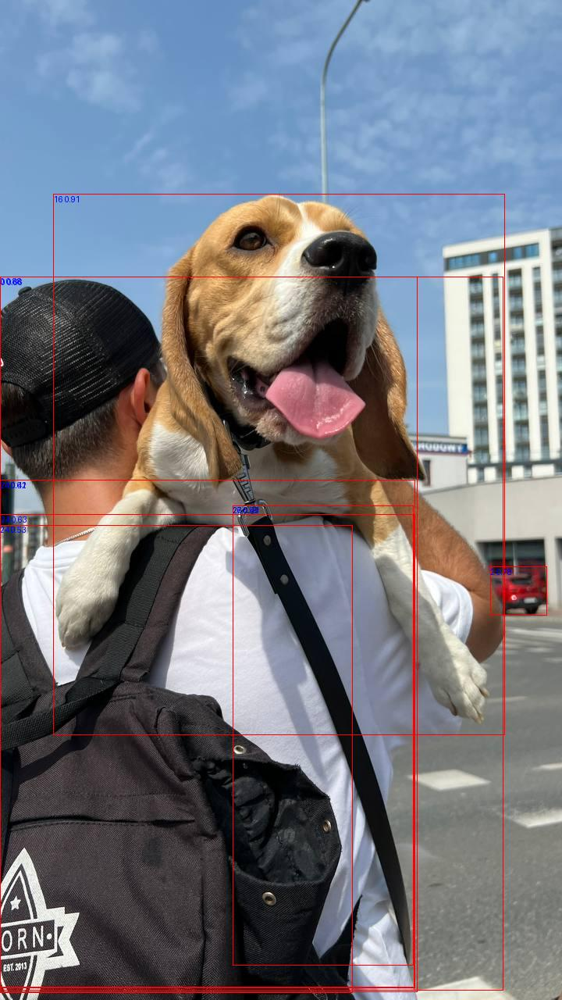

In [ ]:
from IPython.display import Image as IPyImage
IPyImage(filename=f'{HOME}/torch_results.jpg', width=600)

### Inference via Pytorch and Visualize with Supervision

In [42]:
import os
import sys
from pathlib import Path
from typing import List, Optional
import supervision as sv
import torch
import torch.nn as nn
import torchvision.transforms as T
from PIL import Image
from tqdm import tqdm
import cv2
sys.path.append(os.path.abspath("./D-FINE/"))
from src.core import YAMLConfig

In [ ]:
MSCOCO_NAMELIST = (
'person',
'bicycle',
'car',
'motorcycle',
'airplane',
'bus',
'train',
'truck',
'boat',
'traffic light',
'fire hydrant',
'stop sign',
'parking meter',
'bench',
'bird',
'cat',
'dog',
'horse',
'sheep',
'cow',
'elephant',
'bear',
'zebra',
'giraffe',
'backpack',
'umbrella',
'handbag',
'tie',
'suitcase',
'frisbee',
'skis',
'snowboard',
'sports ball',
'kite',
'baseball bat',
'baseball glove',
'skateboard',
'surfboard',
'tennis racket',
'bottle',
'wine glass',
'cup',
'fork',
'knife',
'spoon',
'bowl',
'banana',
'apple',
'sandwich',
'orange',
'broccoli',
'carrot',
'hot dog',
'pizza',
'donut',
'cake',
'chair',
'couch',
'potted plant',
'bed',
'dining table',
'toilet',
'tv',
'laptop',
'mouse',
'remote',
'keyboard',
'cell phone',
'microwave',
'oven',
'toaster',
'sink',
'refrigerator',
'book',
'clock',
'vase',
'scissors',
'teddy bear',
'hair drier',
'toothbrush'
)


In [ ]:
MODEL_FILENAME = "dfine_l_coco.pth"
YAML_CONFIG_PATH = "./D-FINE/configs/dfine/dfine_hgnetv2_l_coco.yml"
INPUT_IMAGE = "dog.jpeg"
CONFIDENCE_THRESHOLD = 0.4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BOX_ANNOTATOR = sv.BoxAnnotator()
LABEL_ANNOTATOR = sv.LabelAnnotator()
TRANSFORMS = T.Compose(
    [T.Resize((640,640)), T.ToTensor()]
)


cfg = YAMLConfig(
    YAML_CONFIG_PATH, resume=MODEL_FILENAME
)

if "HGNetv2" in cfg.yaml_cfg:
    cfg.yaml_cfg["HGNetv2"]["pretrained"] = False
checkpoint = torch.load(MODEL_FILENAME, map_location=DEVICE)
if "ema" in checkpoint:
    state = checkpoint["ema"]["module"]
else:
    state = checkpoint["model"]


cfg.model.load_state_dict(state)

class Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = cfg.model.deploy()
        self.postprocessor = cfg.postprocessor.deploy()

    def forward(self, images, orig_target_sizes):
        outputs = self.model(images)
        outputs = self.postprocessor(outputs, orig_target_sizes)
        return outputs

model = Model().to(DEVICE)

im_pil = Image.open(INPUT_IMAGE).convert('RGB')
w, h = im_pil.size
orig_size = torch.tensor([[w, h]]).to(DEVICE)
im_data = TRANSFORMS(im_pil).unsqueeze(0).to(DEVICE)
output = model(im_data, orig_size)
labels, boxes, scores = output
class_id = labels.detach().cpu().numpy().astype(int)
xyxy = boxes.detach().cpu().numpy()
confidence = scores.detach().cpu().numpy()

detections = sv.Detections(
    xyxy=xyxy[0],
    confidence=confidence[0],
    class_id=class_id[0],
)


detections = detections[detections.confidence > CONFIDENCE_THRESHOLD].with_nms()

class_names = []
for idx in detections.class_id:
    class_names.append(MSCOCO_NAMELIST[idx])

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(class_names, detections.confidence)
]


annotated_image = BOX_ANNOTATOR.annotate(scene=im_pil,detections=detections)
annotated_image = LABEL_ANNOTATOR.annotate(scene=annotated_image,detections=detections,labels=labels)


detections = detections[detections.confidence > CONFIDENCE_THRESHOLD].with_nms()

annotated_image = BOX_ANNOTATOR.annotate(scene=im_pil,detections=detections)
annotated_image = LABEL_ANNOTATOR.annotate(scene=annotated_image,detections=detections,labels=labels)


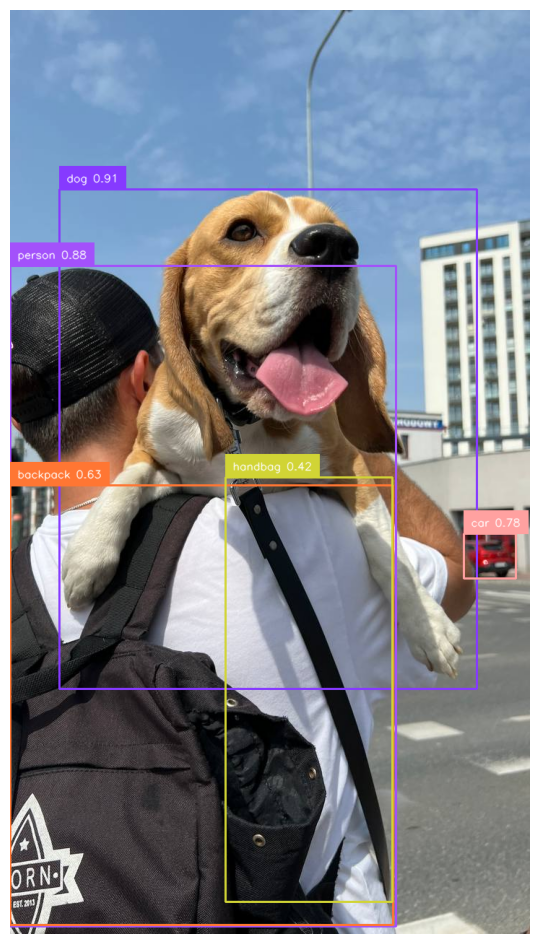

In [ ]:
sv.plot_image(annotated_image)

# Training D-FINE on custom dataset

In this tutorial, we will use one of the [datasets](https://universe.roboflow.com/roboflow-100/circuit-elements) available on [Roboflow Universe](https://universe.roboflow.com/). When downloading, make sure to select the `coco` export format.

## About Dataset

It is RF-100 Circuit dataset

*   Class Number: 46
*   Train Image: 672
*   Validation Image: 64
*   Test Image : 36



In [ ]:
%pip install roboflow

In [ ]:
!mkdir -p {HOME}/datasets
%cd {HOME}/datasets

In [7]:
from roboflow import Roboflow
from google.colab import userdata
ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')

rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("roboflow-100").project("circuit-elements")
version = project.version(3)
dataset = version.download("coco")

%cd ..

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to circuit-elements-3 in coco:: 100%|██████████| 780/780 [00:00<00:00, 3108.44it/s]

/content


## Training on Custom Dataset

## Configuration File Modifications

This code modifies two YAML configuration files for a machine learning project:

### 1. Custom Detection Configuration
- Opens `custom_detection.yml` and updates:
  - Dataset paths to point to circuit-elements-3 dataset
  - Changes training data path from `/data/yourdataset/train` to dataset path
  - Updates validation data path from `/data/yourdataset/val` to dataset path
  - Sets number of classes from 777 to 46 (based on dataset)
  - Reduces number of workers from 4 to 2

### 2. Data Loader Configuration
- Opens `dataloader.yml` and modifies:
  - Reduces total batch size from 32 to 8
  - Reduces another batch size from 64 to 16
  - Decreases number of workers from 4 to 1

The changes appear to optimize the configuration for a smaller compute environment by:
- Using local paths instead of network paths
- Reducing batch sizes
- Decreasing parallel workers
- Updating dataset-specific parameters






In [8]:
import os

custom_detection_config = os.path.join(HOME, 'D-FINE/configs/dataset/custom_detection.yml')

with open(custom_detection_config, 'r') as file:
  data = file.read()


data = data.replace('/data/yourdataset/train/train.json', os.path.join(HOME, 'datasets/circuit-elements-3/train/_annotations.coco.json'))
data = data.replace('/data/yourdataset/val/val.json', os.path.join(HOME, 'datasets/circuit-elements-3/valid/_annotations.coco.json'))
data = data.replace('/data/yourdataset/train', os.path.join(HOME, 'datasets/circuit-elements-3/train'))
data = data.replace('/data/yourdataset/val', os.path.join(HOME, 'datasets/circuit-elements-3/valid'))
data = data.replace('num_classes: 777 # your dataset classes', 'num_classes: 46') # class number coming from the dataset
data = data.replace('num_workers: 4', 'num_workers: 2')


with open(custom_detection_config, 'w') as file:
    file.write(data)

In [12]:
data_loader_path = os.path.join(HOME, 'D-FINE/configs/dfine/include/dataloader.yml')

with open(data_loader_path, 'r') as file:
  data = file.read()

data = data.replace('total_batch_size: 32 #', 'total_batch_size: 8 #')
data = data.replace('total_batch_size: 64', 'total_batch_size: 16')
data = data.replace('num_workers: 4', 'num_workers: 1')


with open(data_loader_path, 'w') as file:
    file.write(data)

Let's do a final check of our custom detection dataset configurations

In [33]:
!cat /content/D-FINE/configs/dataset/custom_detection.yml

task: detection

evaluator:
  type: CocoEvaluator
  iou_types: ['bbox', ]

num_classes: 46
remap_mscoco_category: False

train_dataloader:
  type: DataLoader
  dataset:
    type: CocoDetection
    img_folder: /content/datasets/circuit-elements-3/train
    ann_file: /content/datasets/circuit-elements-3/train/_annotations.coco.json
    return_masks: False
    transforms:
      type: Compose
      ops: ~
  shuffle: True
  num_workers: 2
  drop_last: True
  collate_fn:
    type: BatchImageCollateFunction


val_dataloader:
  type: DataLoader
  dataset:
    type: CocoDetection
    img_folder: /content/datasets/circuit-elements-3/valid
    ann_file: /content/datasets/circuit-elements-3/valid/_annotations.coco.json
    return_masks: False
    transforms:
      type: Compose
      ops: ~
  shuffle: False
  num_workers: 2
  drop_last: False
  collate_fn:
    type: BatchImageCollateFunction


In [32]:
!cat /content/D-FINE/configs/dfine/include/dataloader.yml


train_dataloader:
  dataset:
    transforms:
      ops:
        - {type: RandomPhotometricDistort, p: 0.5}
        - {type: RandomZoomOut, fill: 0}
        - {type: RandomIoUCrop, p: 0.8}
        - {type: SanitizeBoundingBoxes, min_size: 1}
        - {type: RandomHorizontalFlip}
        - {type: Resize, size: [640, 640], }
        - {type: SanitizeBoundingBoxes, min_size: 1}
        - {type: ConvertPILImage, dtype: 'float32', scale: True}
        - {type: ConvertBoxes, fmt: 'cxcywh', normalize: True}
      policy:
        name: stop_epoch
        epoch: 72 # epoch in [71, ~) stop `ops`
        ops: ['RandomPhotometricDistort', 'RandomZoomOut', 'RandomIoUCrop']

  collate_fn:
    type: BatchImageCollateFunction
    base_size: 640
    base_size_repeat: 3
    stop_epoch: 72 # epoch in [72, ~) stop `multiscales`

  shuffle: True
  total_batch_size: 8 # total batch size equals to 32 (4 * 8)
  num_workers: 1


val_dataloader:
  dataset:
    transforms:
      ops:
        - {type: Resize, si

In [14]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [13]:
!CUDA_VISIBLE_DEVICES=0 torchrun --master_port=7777 --nproc_per_node=1 D-FINE/train.py -c D-FINE/configs/dfine/custom/dfine_hgnetv2_l_custom.yml --use-amp --seed=0

2024-12-01 15:40:16.548160: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-01 15:40:16.565327: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-01 15:40:16.586433: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-01 15:40:16.592798: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-01 15:40:16.607674: I tensorflow/core/platform/cpu_feature_guar

In [18]:
%tensorboard --logdir /content/output/dfine_hgnetv2_l_custom/summary

<IPython.core.display.Javascript object>

# Inference custom model on a example image

In [ ]:
!wget -O arduino.jpg https://images.unsplash.com/photo-1603732551658-5fabbafa84eb?ixlib=rb-4.0.3&q=85&fm=jpg&crop=entropy&cs=srgb&dl=sahand-babali-gavODTHG36Y-unsplash.jpg&w=1920

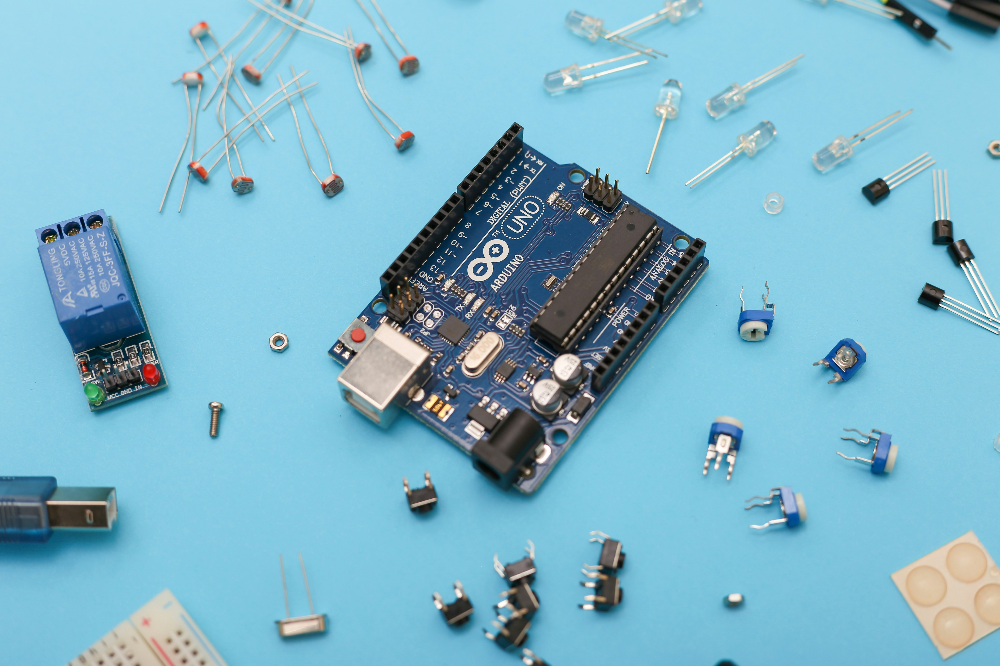

In [34]:
# Preview of the image
from IPython.display import Image as IPyImage
IPyImage(filename=f'{HOME}/arduino.jpg', width=600)

In [36]:
from PIL import Image

# Resize image
image = Image.open("arduino.jpg")
image = image.resize((640, 640))
image.save("arduino_640.jpg")

In [30]:
!python D-FINE/tools/inference/torch_inf.py -c D-FINE/configs/dfine/custom/dfine_hgnetv2_l_custom.yml -r output/dfine_hgnetv2_l_custom/last.pth --input arduino_640.jpg --device cuda:0

2024-12-01 18:11:22.983370: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-01 18:11:23.000386: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-01 18:11:23.021204: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-01 18:11:23.027462: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-01 18:11:23.042368: I tensorflow/core/platform/cpu_feature_guar

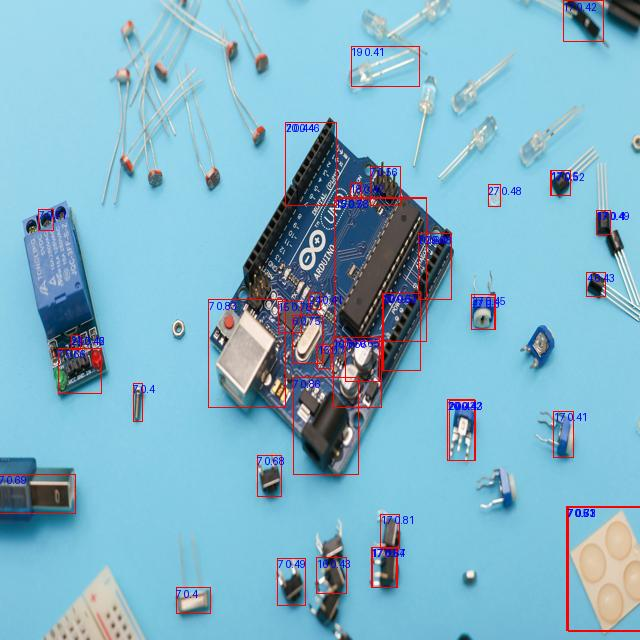

In [35]:
# Show results
IPyImage(filename=f'{HOME}/torch_results.jpg', width=600)

## Load Test and Valid Dataset

In [48]:
import supervision as sv

ds_test = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

ds_valid = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/valid",
    annotations_path=f"{dataset.location}/valid/_annotations.coco.json",
)

ds_merged = sv.DetectionDataset.merge([ds_test, ds_valid])
len(ds_merged)


print(ds_test.classes)
print(ds_valid.classes)
print(ds_merged.classes)

['circuit', 'Button', 'Buzzer', 'Capacitor', 'Capacitor Jumper', 'Capacitor Network', 'Clock', 'Connector', 'Diode', 'EM', 'Electrolytic Capacitor', 'Electrolytic capacitor', 'Ferrite Bead', 'Flex Cable', 'Fuse', 'IC', 'Inductor', 'Jumper', 'Led', 'Pads', 'Pins', 'Potentiometer', 'RP', 'Resistor', 'Resistor Jumper', 'Resistor Network', 'Switch', 'Test Point', 'Transducer', 'Transformer', 'Transistor', 'Unknown Unlabeled']
['circuit', 'Button', 'Buzzer', 'Capacitor', 'Capacitor Jumper', 'Capacitor Network', 'Clock', 'Connector', 'Diode', 'EM', 'Electrolytic Capacitor', 'Electrolytic capacitor', 'Ferrite Bead', 'Flex Cable', 'Fuse', 'IC', 'Inductor', 'Jumper', 'Led', 'Pads', 'Pins', 'Potentiometer', 'RP', 'Resistor', 'Resistor Jumper', 'Resistor Network', 'Switch', 'Test Point', 'Transducer', 'Transformer', 'Transistor', 'Unknown Unlabeled']
['Button', 'Buzzer', 'Capacitor', 'Capacitor Jumper', 'Capacitor Network', 'Clock', 'Connector', 'Diode', 'EM', 'Electrolytic Capacitor', 'Electroly

## Calculate Model Metrics


*   Mean Average Precission
*   F1 Score
*   Confusion Matrix




In [53]:
import supervision as sv
import torch
import torch.nn as nn
import torchvision.transforms as T
from PIL import Image
from supervision.metrics import F1Score, MeanAveragePrecision
from tqdm import tqdm

MODEL_FILENAME = "output/dfine_hgnetv2_l_custom/last.pth"
YAML_CONFIG_PATH = "./D-FINE/configs/dfine/custom/dfine_hgnetv2_l_custom.yml"
TRANSFORMS = T.Compose(
    [T.Resize((640,640)), T.ToTensor()]
)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [54]:
def run_on_image(model, image_array):
    im_pil = Image.fromarray(image_array)
    w, h = im_pil.size
    orig_size = torch.tensor([[w, h]]).to(DEVICE)
    im_data = TRANSFORMS(im_pil).unsqueeze(0).to(DEVICE)
    output = model(im_data, orig_size)
    labels, boxes, scores = output
    class_id = labels.detach().cpu().numpy().astype(int)
    xyxy = boxes.detach().cpu().numpy()
    confidence = scores.detach().cpu().numpy()

    detections = sv.Detections(
        xyxy=xyxy[0],
        confidence=confidence[0],
        class_id=class_id[0],
    )
    return detections

In [55]:
cfg = YAMLConfig(
    YAML_CONFIG_PATH, resume=MODEL_FILENAME
)

if "HGNetv2" in cfg.yaml_cfg:
    cfg.yaml_cfg["HGNetv2"]["pretrained"] = False
checkpoint = torch.load(MODEL_FILENAME, map_location=DEVICE)
if "ema" in checkpoint:
    state = checkpoint["ema"]["module"]
else:
    state = checkpoint["model"]


cfg.model.load_state_dict(state)

class Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = cfg.model.deploy()
        self.postprocessor = cfg.postprocessor.deploy()

    def forward(self, images, orig_target_sizes):
        outputs = self.model(images)
        outputs = self.postprocessor(outputs, orig_target_sizes)
        return outputs

model = Model().to(DEVICE)



In [68]:
# @title Collect predictions

predictions = []
targets = []
print("Evaluating...")
for _, image, target_detections in tqdm(ds_valid, total=len(ds_valid)):
    detections = run_on_image(model, image)
    detections = detections[detections.confidence > 0.001]
    predictions.append(detections)
    targets.append(target_detections)

Evaluating...


100%|██████████| 64/64 [00:03<00:00, 17.25it/s]


In [69]:
# @title Collect maP and F1 metrics

mAP_metric = MeanAveragePrecision()
f1_score = F1Score()

f1_score_result = f1_score.update(predictions, targets).compute()
mAP_result = mAP_metric.update(predictions, targets).compute()

In [81]:
# @title maP Results

print(mAP_result.map50_95)
print(mAP_result.map50)
print(mAP_result.map75)

0.04512539627062785
0.09946413772293412
0.026075016568393537


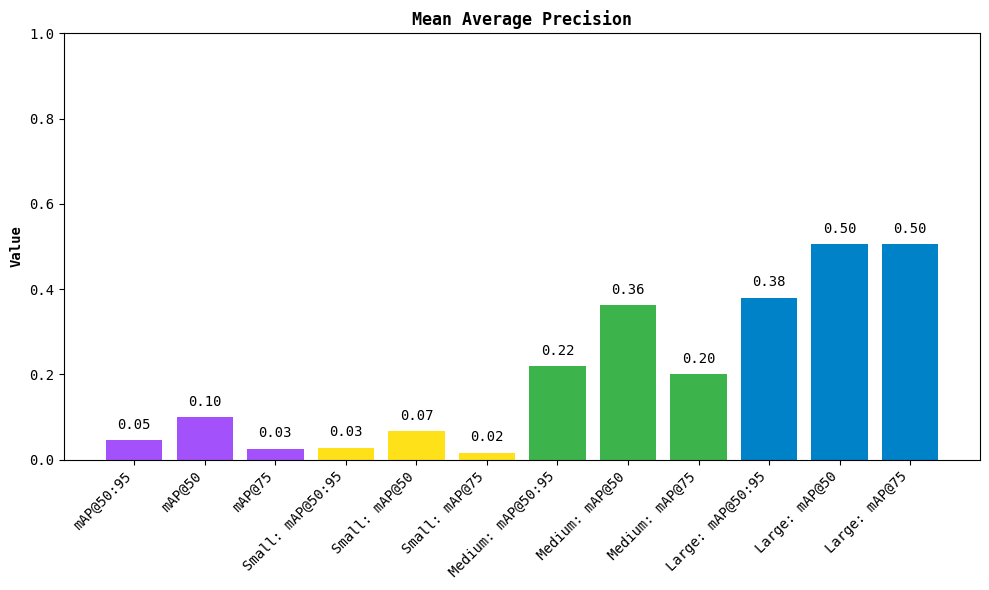

In [71]:
mAP_result.plot()

In [82]:
# @title F1 Results

print(f1_score_result.f1_50)
print(f1_score_result.f1_75)

0.07544642837625108
0.027499445961266147


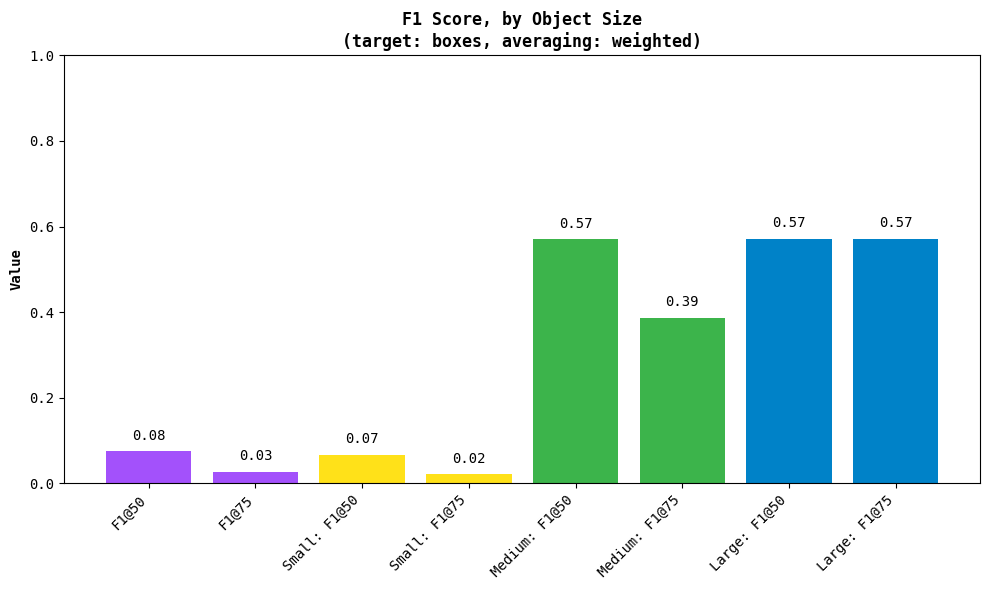

In [83]:
f1_score_result.plot()

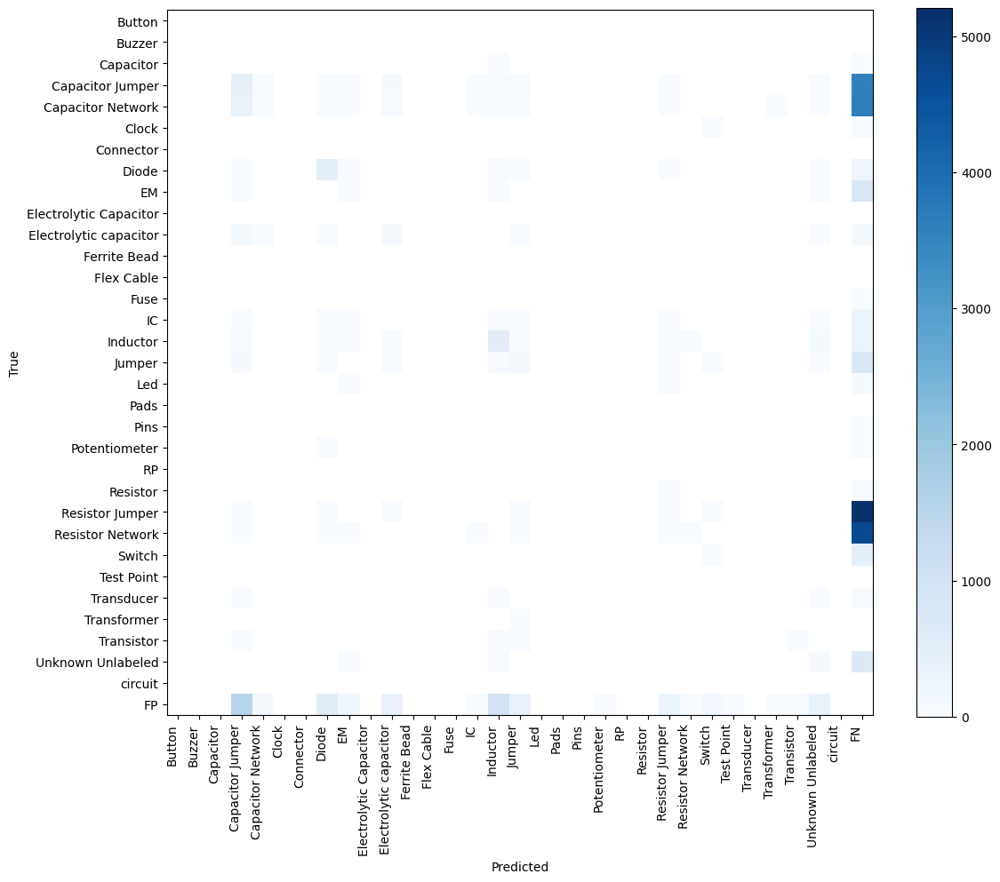

In [76]:
# @title Calculate Confusion Matrix

confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds_merged.classes
)

_ = confusion_matrix.plot()